# EDA_AUTO data analysis package:-

Your project is to build a data analysis tool that facilitates data exploration (EDA) using programming in Python. The goal of this tool is to simplify the EDA process by automating the initial steps of data processing and providing a comprehensive analysis dashboard for each type of column present in the data.

The main tasks you should perform in this project include:

1. Design a command-line interface for the tool: You must design an easy-to-use user interface that enables users to upload data files in multiple formats such as CSV, Excel, and SQL databases.

2. Data processing: You must apply data processing steps to the entered data. These steps include dealing with missing values, coding categorical variables, reducing the size of numeric variables, and so on.

3. Feature Discovery and Dimensionality Reduction: The tool can offer options to discover important features and reduce dimensionality of data, making it easier to analyze large data sets.

4. Create comprehensive analysis panels: You should implement custom analysis panels for each type of column in the data. These panels can include graphs such as histograms, bounding boxes, and scatterplots.

5. Use graphing libraries: You should use Python libraries like Matplotlib, Seaborn, and Plotly to create interactive graphs that users can explore and customize.

6. Test and debug the tool: You must carefully test the tool to ensure that it is working properly and that it meets all requirements specified in the project.

This project requires Python programming skills and a good understanding of data analysis and processing. It would also be a good idea to study the data file provided by Kaggle to understand its content and processing requirements.

Once the tool is developed and well tested, you can provide comprehensive documentation of how to use the tool and how to configure it.

In [1]:
#>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
#One stage: Definition of libraries
print("One stage: Definition of libraries were processed successfully........")
#>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>

# Firstly: Download the required librarie
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tkinter as tk
from tkinter import filedialog
from tkinter import messagebox
from tkinter import simpledialog
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler


One stage: Definition of libraries were processed successfully........


In [2]:
## Func1.Read data of any file
def read_dataset(file_path):
    # التحقق من نوع الملف
    if file_path.endswith(".csv"):
        data = pd.read_csv(file_path)
        print("CSV file uploaded successfully.")

    elif file_path.endswith(".txt"):
        data = pd.read_csv(file_path, sep="\t")  # قراءة ملف نصي مع فاصل مخصص
        print("txt file uploaded successfully.")

    elif file_path.endswith(".xlsx"):
        data = pd.read_excel(file_path)  # قراءة ملف نصي مع فاصل مخصص
        print("excel file uploaded successfully")
    else:
        print("The type is not supported.")
    return data

In [3]:
## Func2. Know the types of data
def infer_column_types(data):
    # إنشاء قاموس لتخزين أنواع البيانات في كل عمود
    data_types = {}

    # الحصول على الصف الأول من البيانات (الصف الأول يحتوي على البيانات الأولى في كل عمود)
    first_row = data.iloc[0]

    # التفحص عن أنواع البيانات في كل عمود
    for column_name, value in first_row.iteritems():
        data_type = type(value).__name__
        data_types[column_name] = data_type

    return data_types


In [4]:
## Func3. check_missing_values
def check_missing_values(dataset):
    # إنشاء قاموس لتخزين عدد القيم المفقودة في كل عمود
    missing_values = {}
    data = dataset
    # الحصول على عدد الصفوف الإجمالي في المجموعة
    total_rows = data.shape[0]

    # التفحص عن القيم المفقودة في كل عمود
    for column in data.columns:
        missing_count = total_rows - data[column].count()
        missing_values[column] = missing_count

    return missing_values


In [5]:
## Func4. get_dataset_shape
def get_dataset_shape(dataset):
    # استخدم الدالة len() لحساب عدد الصفوف
    row_count = len(dataset)

    # استخدم دالة len() مع أي صف من مجموعة البيانات لحساب عدد الأعمدة
    # افترض أن المجموعة تحتوي على صفوف وأن الأعمدة موجودة في أول صف
    column_count = len(dataset.iloc[0])

    return row_count, column_count


In [6]:
## Func5. count_unique_valuesfrom collections import defaultdict
from collections import defaultdict

def find_unique_values(dataframe):
    unique_values_dict = defaultdict(set)
    for column in dataframe.columns:
        for value in dataframe[column]:
            unique_values_dict[column].add(value)
    return unique_values_dict


In [7]:
## Func5. count_unique_values
def count_unique_values(dataset):
    # إنشاء قاموس لتخزين عدد القيم الفريدة في كل عمود
    unique_values_count = {}
    
    # التفحص عن القيم الفريدة في كل عمود
    for column_name in dataset.columns:
        column_data = dataset[column_name]
        unique_values = set()

        for value in column_data:
            unique_values.add(value)

        unique_count = len(unique_values)
        unique_values_count[column_name] = unique_count

    return unique_values_count


In [8]:
# Func8. Data encoding
# دالة لتنفيذ Label Encoding على الأعمدة المحددة
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

def encode_selected_features(dataframe, selected_features, encoding_type='label'):
    try:
        encoded_data = dataframe.copy()
        for feature in selected_features:
            if encoding_type == 'label':
                label_encoder = LabelEncoder()
                encoded_data[feature] = label_encoder.fit_transform(encoded_data[feature])
            elif encoding_type == 'one-hot':
                encoded_data = pd.get_dummies(encoded_data, drop_first=True, columns=[feature])
            else:
                return "Invalid encoding type. Use 'label' or 'one-hot'."

        return encoded_data
    except Exception as e:
        return f"An error occurred while processing data: {e}"

In [9]:
## Func9. function to interact with the user to enter specified variables
# دالة للتفاعل مع المستخدم لإدخال المتغيرات المحددة
def get_selected_features_from_user():
    selected_features = []
    while True:
        feature = input("Enter the variable name (Press Enter to finish): ")
        if not feature:  # إذا تم الضغط على Enter دون إدخال قيمة
            break
        selected_features.append(feature)
    return selected_features


In [10]:
## Func11. Data standardization function
# تعريف دالة التحول باستخدام توحيد القياس (Standardization)
def standardize_data(df):
    df_std = (df - df.mean()) / df.std()
    return df_std

In [11]:
## Func12. min_max_scaling
# تعريف دالة التحول باستخدام تحويل القيم إلى مدى محدد (MinMax Scaling)
def min_max_scaling(df):
    min_value = df.min()
    max_value = df.max()
    df_scaled = (df - min_value) / (max_value - min_value)
    return df_scaled


In [12]:
## Func13. normalize_data
# تعريف دالة التحول باستخدام التطبيع (Normalization)
def normalize_data(df):
    mean_value = df.mean()
    std_value = df.std()
    df_normalized = (df - mean_value) / std_value
    return df_normalized

In [13]:
## Func14. apply_transformation
# دالة لتطبيق التحول باستناء نوع التحويل كمعامل
def apply_transformation(df, transformation_type):
    if transformation_type == 'std':
        transformed_data = standardize_data(df)
    elif transformation_type == 'min_max':
        transformed_data = min_max_scaling(df)
    elif transformation_type == 'normalize':
        transformed_data = normalize_data(df)
    else:
        raise ValueError("Invalid transformation type")
    return transformed_data

In [14]:
## Func15. handle_missing_values
def handle_missing_values(dataset):
    missing_values_exist = False  # متغير للتحقق من وجود قيم مفقودة
    
    for col in dataset.columns:
        # التحقق مما إذا كانت هناك قيم مفقودة في العمود
        if dataset[col].isnull().any():
            missing_values_exist = True  # هناك قيم مفقودة
            print(f"Missing values found in column '{col}'.")
            # توصيات افتراضية بناءً على نوع العمود
            default_recommendation = ""
            if dataset[col].dtype in ['int64', 'float64']:
                default_recommendation = "Use (median)"
            elif dataset[col].dtype == 'object':
                default_recommendation = "Use (mode)"
            
            # عرض نوع العمود وتوصية افتراضية
            print(f"column '{col}' ({dataset[col].dtype})")
            print(f"How would you like to address this column? (default proposal : {default_recommendation})")
            print("1. Use average")
            print("2. Use median")
            print("3.Use common value (mode)")
            choice = input("Choose the option number: ")

            # معالجة القيم المفقودة وفقًا لاختيار المستخدم أو التوصية الافتراضية
            if choice == '1':
                # استخدام المتوسط
                mean_value = dataset[col].mean()
                dataset[col].fillna(mean_value, inplace=True)
            elif choice == '2':
                # استخدام الوسيط
                median_value = dataset[col].median()
                dataset[col].fillna(median_value, inplace=True)
            elif choice == '3':
                # استخدام المنوال
                mode_value = dataset[col].mode()[0]
                dataset[col].fillna(mode_value, inplace=True)
            else:
                print("The option is invalid. The column will be ignored.")
    
    # بعد الانتهاء من معالجة القيم المفقودة، قم بالتحقق مما إذا كانت هناك قيم مفقودة أم لا
    if not missing_values_exist:
        print("No missing values found in the dataset.")


In [15]:
## Func16. handle_outliers_iqr
def handle_outliers_iqr(dataset, iqr_factor=1.5, replace_with=None, outlier_strategy="clip"):
    
    # حساب الربع الأول والثالث
    Q1 = dataset.quantile(0.25)
    Q3 = dataset.quantile(0.75)

    # حساب IQR (النطاق بين الربعين الداخلي)
    IQR = Q3 - Q1

    # تحديد الحدود السفلية والعليا للقيم المتطرفة
    lower_bound = Q1 - (iqr_factor * IQR)
    upper_bound = Q3 + (iqr_factor * IQR)

    # معالجة القيم المتطرفة بناءً على الاستراتيجية المختارة
    dataset_no_outliers = dataset.copy()
    for col in dataset.columns:
        if outlier_strategy == "clip":
            dataset_no_outliers[col] = dataset_no_outliers[col].clip(lower=lower_bound[col], upper=upper_bound[col])
        elif outlier_strategy == "replace":
            dataset_no_outliers[col] = dataset_no_outliers[col].apply(lambda x: replace_with if x < lower_bound[col] or x > upper_bound[col] else x)
        elif outlier_strategy == "std":
            std_value = dataset_no_outliers[col].std()
            dataset_no_outliers[col] = dataset_no_outliers[col].apply(lambda x: Q1[col] - 2 * std_value if x < lower_bound[col] else (Q3[col] + 2 * std_value if x > upper_bound[col] else x))

    return dataset_no_outliers



In [16]:
## Func19. Draw the frequency distribution of the data
# دالة لرسم histograms للبيانات العددية
def plot_histograms(dataframe):
    numeric_columns = dataframe.select_dtypes(include=['number']).columns
    for column in numeric_columns:
        plt.figure(figsize=(8, 4))
        sns.histplot(data=dataframe, x=column, kde=True)
        plt.title(f"Histogram For numerical data - {column}")
        plt.xlabel(column)
        plt.ylabel("Frequency of values")
        plt.show()
        

In [17]:
## Func20. Draw Box Plot of the data
# دالة لرسم box plots للبيانات العددية
def plot_box_plots(dataframe):
    numeric_columns = dataframe.select_dtypes(include=['number']).columns
    for column in numeric_columns:
        plt.figure(figsize=(8, 4))
        sns.boxplot(data=dataframe, y=column)
        plt.title(f"Box Plot For numerical data - {column}")
        plt.ylabel(column)
        plt.show()
        

In [18]:
## Func21. Draw Scatter Plot of the data
# دالة لرسم scatter plots بين الأعمدة العددية
def plot_scatter_plots(dataframe):
    numeric_columns = dataframe.select_dtypes(include=['number']).columns
    if len(numeric_columns) >= 2:
        for i in range(len(numeric_columns)):
            for j in range(i + 1, len(numeric_columns)):
                plt.figure(figsize=(8, 6))
                sns.scatterplot(data=dataframe, x=numeric_columns[i], y=numeric_columns[j])
                plt.title(f"Scatter Plot VS {numeric_columns[i]} و{numeric_columns[j]}")
                plt.xlabel(numeric_columns[i])
                plt.ylabel(numeric_columns[j])
                plt.show()
                

In [19]:
## Func22. Draw correlation_heatmap of the data
def plot_correlation_heatmap(dataframe):
    # استخراج السمات العددية
    numeric_columns = dataframe.select_dtypes(include=['number'])
    # حساب معاملات الارتباط
    correlation_matrix = numeric_columns.corr()
    # تعديل القيم لتقريبها لأقرب عدد عشري
    correlation_matrix = np.round(correlation_matrix, decimals=2)
    # رسم Heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
    plt.title("Heatmap For correlation coefficients between numerical features")
    plt.show()

In [20]:
## Func23. select_features for anlysis
def select_features(dataset):
    
    # استخراج قائمة الميزات المتاحة
    available_features = dataset.columns.tolist()

    print("الميزات المتاحة:")
    for idx, feature in enumerate(available_features):
        print(f"{idx + 1}. {feature}")

    selected_features = []
    while True:
        try:
            user_input = input("Please enter the desired feature number or leave blank to continue: ")
            if user_input == "":
                break
            feature_idx = int(user_input) - 1
            if feature_idx >= 0 and feature_idx < len(available_features):
                selected_features.append(available_features[feature_idx])
            else:
                print("invalid number. Please enter a valid number.")

        except ValueError:
            print("invalid number. Please enter a valid number.")

    return selected_features


In [21]:
## Func24. analyze_numeric_data
def analyze_numeric_data(selected_data):
    # عرض الوصف الإحصائي للأعمدة العددية
    numeric_columns = selected_data.select_dtypes(include=['number'])
    if not numeric_columns.empty:
        print("Statistical description of numerical variables:")
        print(numeric_columns.describe())

    # رسم هيستوغرامات للمتغيرات العددية
    for column in numeric_columns.columns:
        plt.figure(figsize=(8, 6))
        sns.histplot(selected_data[column], kde=True)
        plt.title(f"Histogram of the variable {column}")
        plt.xlabel(column)
        plt.ylabel("Frequency")
        plt.show()

    # رسم مربعات اللحنة للمتغيرات العددية
    for column in numeric_columns.columns:
        plt.figure(figsize=(8, 6))
        sns.boxplot(x=selected_data[column])
        plt.title(f"boxplot of the variable {column}")
        plt.xlabel(column)
        plt.show()

    # رسم مخططات الانتشار للمتغيرات العددية مع بعضها البعض
    if len(numeric_columns.columns) > 1:
        sns.pairplot(selected_data[numeric_columns.columns])
        plt.suptitle("Scatterplots between numerical variables")
        plt.show()



In [22]:
## Func24.analyze_categorical_data
def analyze_categorical_data(selected_data):
    # عرض الوصف الإحصائي للأعمدة الفئوية
    categorical_columns = selected_data.select_dtypes(exclude=['number'])
    if not categorical_columns.empty:
        print("Statistical description of categorical variables:")
        print(categorical_columns.describe())

    # رسم كونت بلوت (Count Plot) للمتغيرات الفئوية
    for column in categorical_columns.columns:
        plt.figure(figsize=(10, 6))
        sns.countplot(data=selected_data, x=column, palette="viridis")
        plt.title(f"Count the plot of the variable {column}")
        plt.xlabel(column)
        plt.ylabel("the number")
        plt.xticks(rotation=45)
        plt.show()

 

In [23]:
## Func25.dimensionality_reduction
from sklearn.decomposition import PCA
def dimensionality_reduction(data, n_components):
   
    # استبدال القيم المفقودة بوسيلة مناسبة إذا كانت موجودة
    data = data.fillna(0)  # يمكن تغيير هذا وفقًا لاحتياجات البيانات

    # تقليل الأبعاد باستخدام PCA
    pca = PCA(n_components=n_components)
    reduced_data = pca.fit_transform(data)

    # إنشاء DataFrame جديد للبيانات المقللة
    reduced_data = pd.DataFrame(reduced_data, columns=[f"Component {i+1}" for i in range(n_components)])

    return reduced_data



In [24]:
## Func26.plot_2d_components
def plot_2d_components(components, target=None):
    
    # إنشاء الرسم
    plt.figure(figsize=(8, 6))
    
    if target is None:
        # إذا لم يتم توفير بيانات مستهدفة، رسم المكونين بلون واحد
        plt.scatter(components.iloc[:, 0], components.iloc[:, 1], marker='o', alpha=0.7)
    else:
        # إذا تم توفير بيانات مستهدفة، رسم المكونين بألوان مختلفة بناءً على الفئات
        sns.scatterplot(x=components.iloc[:, 0], y=components.iloc[:, 1], hue=target, palette="viridis", alpha=0.7)

    # تعيين عنوان وتسميات المحاور
    plt.title("The relationship of the two components after dimensionality reduction")
    plt.xlabel("First component")
    plt.ylabel("The second component")

    # إظهار مفتاح الألوان إذا كان هناك بيانات مستهدفة
    if target is not None:
        plt.legend(title="Categories")

    # عرض الرسم
    plt.grid(True)
    plt.show()



In [25]:

#>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Four stage: Enter data from any source
print('Four stage: Enter data from any source...')
#>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
import pandas as pd
from tkinter import filedialog, Tk

# الإعدادات الأولية للنافذة
root = Tk()

try:
    # الحصول على مسار الملف المحدد بواسطة المستخدم
    file_path = filedialog.askopenfilename(title="Choose CSV, Text, or xlsx file")

    if file_path:
        dataset = read_dataset(file_path)
        print('\n')
        print("dataset.................:")
        dataset = pd.DataFrame(dataset)
    else:
        print("No file selected.")
except Exception as e:
    print(f"an error occurred: {e}")


root.withdraw()  # إخفاء النافذة الرئيسية
dataset


Four stage: Enter data from any source...
CSV file uploaded successfully.


dataset.................:


,data_dte,Year,Month,usg_apt_id,usg_apt,usg_wac,fg_apt_id,fg_apt,fg_wac,airlineid,carrier,carriergroup,type,Scheduled,Charter,Total
0,05/01/2006,2006,5,12016,GUM,5,13162,MAJ,844,20177,PFQ,1,Departures,0,10,10
1,05/01/2003,2003,5,10299,ANC,1,13856,OKO,736,20007,5Y,1,Departures,0,15,15
2,03/01/2007,2007,3,10721,BOS,13,12651,KEF,439,20402,GL,1,Departures,0,1,1
3,12/01/2004,2004,12,11259,DAL,74,16271,YYZ,936,20201,AMQ,1,Departures,0,1,1
4,05/01/2009,2009,5,13303,MIA,33,11075,CMW,219,21323,5L,0,Departures,0,20,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
930803,07/01/2000,2000,7,13303,MIA,33,13605,NAS,204,20398,MQ,1,Departures,1422,0,1422
930804,04/01/2019,2019,4,13303,MIA,33,14286,PTY,162,19770,CM,0,Departures,1439,0,1439
930805,08/01/2000,2000,8,13303,MIA,33,13605,NAS,204,20398,MQ,1,Departures,1441,0,1441
930806,09/01/2004,2004,9,12266,IAH,74,15632,VSA,148,19534,AM,0,Departures,1461,0,1461


In [26]:
#>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Fifth stage: data exploration
print('\n')
print('Fifth stage: data exploration')
#>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>



Fifth stage: data exploration


In [27]:
## 1. Data type
data_types = infer_column_types(dataset)
print('\n')
print("Column types:")
# طباعة أنواع البيانات في كل عمود
for column, data_type in data_types.items():
    print(f"The data type in the column '{column}': {data_type}")




Column types:
The data type in the column 'data_dte': str
The data type in the column 'Year': int64
The data type in the column 'Month': int64
The data type in the column 'usg_apt_id': int64
The data type in the column 'usg_apt': str
The data type in the column 'usg_wac': int64
The data type in the column 'fg_apt_id': int64
The data type in the column 'fg_apt': str
The data type in the column 'fg_wac': int64
The data type in the column 'airlineid': int64
The data type in the column 'carrier': str
The data type in the column 'carriergroup': int64
The data type in the column 'type': str
The data type in the column 'Scheduled': int64
The data type in the column 'Charter': int64
The data type in the column 'Total': int64


In [28]:
## 2. The size of the data set and the unique values in each column
# عرض معلومات مجموعة البيانات
print('\n')
print('View data set information..')

# استخدام الدالة للحصول على حجم مجموعة البيانات (عدد الصفوف وعدد الأعمدة)
row_count, column_count = get_dataset_shape(dataset)
# طباعة حجم مجموعة البيانات
print(f"The number of rows in the data set is: {row_count} row")
print(f"The number of columns in the data set is: {column_count} column")



View data set information..
The number of rows in the data set is: 930808 row
The number of columns in the data set is: 16 column


In [29]:
# استخدام الدالة للعثور على عدد القيم الفريدة في كل عمود
unique_values_count = count_unique_values(dataset)

# طباعة عدد القيم الفريدة في كل عمود
for column, unique_count in unique_values_count.items():
    print(f"The number of unique values in the column '{column}': {unique_count}")


The number of unique values in the column 'data_dte': 363
The number of unique values in the column 'Year': 31
The number of unique values in the column 'Month': 12
The number of unique values in the column 'usg_apt_id': 1015
The number of unique values in the column 'usg_apt': 1022
The number of unique values in the column 'usg_wac': 54
The number of unique values in the column 'fg_apt_id': 1666
The number of unique values in the column 'fg_apt': 1669
The number of unique values in the column 'fg_wac': 229
The number of unique values in the column 'airlineid': 705
The number of unique values in the column 'carrier': 735
The number of unique values in the column 'carriergroup': 2
The number of unique values in the column 'type': 1
The number of unique values in the column 'Scheduled': 883
The number of unique values in the column 'Charter': 255
The number of unique values in the column 'Total': 886


In [30]:
dataset

,data_dte,Year,Month,usg_apt_id,usg_apt,usg_wac,fg_apt_id,fg_apt,fg_wac,airlineid,carrier,carriergroup,type,Scheduled,Charter,Total
0,05/01/2006,2006,5,12016,GUM,5,13162,MAJ,844,20177,PFQ,1,Departures,0,10,10
1,05/01/2003,2003,5,10299,ANC,1,13856,OKO,736,20007,5Y,1,Departures,0,15,15
2,03/01/2007,2007,3,10721,BOS,13,12651,KEF,439,20402,GL,1,Departures,0,1,1
3,12/01/2004,2004,12,11259,DAL,74,16271,YYZ,936,20201,AMQ,1,Departures,0,1,1
4,05/01/2009,2009,5,13303,MIA,33,11075,CMW,219,21323,5L,0,Departures,0,20,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
930803,07/01/2000,2000,7,13303,MIA,33,13605,NAS,204,20398,MQ,1,Departures,1422,0,1422
930804,04/01/2019,2019,4,13303,MIA,33,14286,PTY,162,19770,CM,0,Departures,1439,0,1439
930805,08/01/2000,2000,8,13303,MIA,33,13605,NAS,204,20398,MQ,1,Departures,1441,0,1441
930806,09/01/2004,2004,9,12266,IAH,74,15632,VSA,148,19534,AM,0,Departures,1461,0,1461


In [31]:
## 6. Check for missing values in the data set 
print('\n')
print('Examine missing values in the dataset...')

# فحص القيم المفقودة في مجموعة البيانات
missing_values = check_missing_values(dataset)
# طباعة عدد القيم المفقودة في كل عمود
for column, count in missing_values.items():
    print(f"The number of missing values in the column '{column}': {count}")




Examine missing values in the dataset...
The number of missing values in the column 'data_dte': 0
The number of missing values in the column 'Year': 0
The number of missing values in the column 'Month': 0
The number of missing values in the column 'usg_apt_id': 0
The number of missing values in the column 'usg_apt': 0
The number of missing values in the column 'usg_wac': 0
The number of missing values in the column 'fg_apt_id': 0
The number of missing values in the column 'fg_apt': 0
The number of missing values in the column 'fg_wac': 0
The number of missing values in the column 'airlineid': 0
The number of missing values in the column 'carrier': 3055
The number of missing values in the column 'carriergroup': 0
The number of missing values in the column 'type': 0
The number of missing values in the column 'Scheduled': 0
The number of missing values in the column 'Charter': 0
The number of missing values in the column 'Total': 0


In [32]:
## 6. Call the function to display the unique values of the specified variables
# استخدم الدالة للعثور على القيم الفريدة
unique_values_result = find_unique_values(dataset)

# عرض القيم الفريدة لكل سمة
for column, unique_values in unique_values_result.items():
    print(f"Unique values in '{column}':")
    for value in unique_values:
        print(value)
    print()


Unique values in 'data_dte':
07/01/2014
07/01/2009
12/01/1996
11/01/2010
04/01/2016
07/01/2002
09/01/1997
12/01/2013
07/01/2010
11/01/2006
03/01/2014
12/01/2006
03/01/1992
03/01/2009
07/01/1993
06/01/2007
11/01/2005
08/01/2018
10/01/2010
07/01/2000
06/01/2008
06/01/1999
11/01/1992
03/01/2015
03/01/1997
11/01/2008
05/01/2000
02/01/2002
10/01/2019
11/01/2003
02/01/2003
12/01/2001
12/01/2010
11/01/1990
02/01/1995
02/01/1997
08/01/1999
04/01/1999
04/01/1991
02/01/2012
06/01/2019
12/01/2012
07/01/1999
10/01/1999
01/01/1996
12/01/2015
11/01/1997
09/01/2001
01/01/2015
08/01/2016
06/01/2001
10/01/2001
12/01/2014
02/01/2016
09/01/2017
05/01/2013
02/01/1994
10/01/1994
05/01/2002
07/01/1996
01/01/2011
01/01/1994
07/01/1997
08/01/2009
01/01/2009
09/01/1992
04/01/2017
08/01/2003
09/01/1994
05/01/2007
10/01/1996
07/01/2005
10/01/2016
01/01/2016
09/01/1998
02/01/2013
10/01/2009
11/01/2000
08/01/2008
12/01/2008
02/01/2010
02/01/2005
02/01/1999
10/01/2015
12/01/2003
05/01/2012
03/01/1993
04/01/2001
04/

In [33]:
#>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>
# Seventh stage: Data processing
print('\n')
print('sexth stage: Data processing.')
#>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>




sexth stage: Data processing.


In [34]:
print('\n')
print('1. Handling missing values')
print('\n')
## 1. Handling missing values
handle_missing_values(dataset)  # فحص ومعالجة القيم المفقودة

# فحص القيم المفقودة في مجموعة البيانات
missing_values = check_missing_values(dataset)
print('\n')
missing_values





1. Handling missing values


Missing values found in column 'carrier'.
column 'carrier' (object)
How would you like to address this column? (default proposal : Use (mode))
1. Use average
2. Use median
3.Use common value (mode)
Choose the option number: 3




{'data_dte': 0,
 'Year': 0,
 'Month': 0,
 'usg_apt_id': 0,
 'usg_apt': 0,
 'usg_wac': 0,
 'fg_apt_id': 0,
 'fg_apt': 0,
 'fg_wac': 0,
 'airlineid': 0,
 'carrier': 0,
 'carriergroup': 0,
 'type': 0,
 'Scheduled': 0,
 'Charter': 0,
 'Total': 0}

In [35]:
print('\n')
print('2. features of the analysis')
print('\n')
## 1. Handling missing values
selected_features = select_features(dataset)
print("Specific features of the analysis:")
for feature in selected_features:
    print(feature)




2. features of the analysis


الميزات المتاحة:
1. data_dte
2. Year
3. Month
4. usg_apt_id
5. usg_apt
6. usg_wac
7. fg_apt_id
8. fg_apt
9. fg_wac
10. airlineid
11. carrier
12. carriergroup
13. type
14. Scheduled
15. Charter
16. Total
Please enter the desired feature number or leave blank to continue: 2
Please enter the desired feature number or leave blank to continue: 4
Please enter the desired feature number or leave blank to continue: 6
Please enter the desired feature number or leave blank to continue: 
Specific features of the analysis:
Year
usg_apt_id
usg_wac


In [36]:
#السمات المختاره للتحليل
selected_data = dataset[selected_features]

Statistical description of numerical variables:
                Year     usg_apt_id        usg_wac
count  930808.000000  930808.000000  930808.000000
mean     2006.021361   12809.473781      42.511740
std         8.558831    2716.223845      27.571338
min      1990.000000   10010.000000       1.000000
25%      1999.000000   11618.000000      22.000000
50%      2007.000000   12892.000000      33.000000
75%      2014.000000   13487.000000      72.000000
max      2020.000000   99999.000000      93.000000


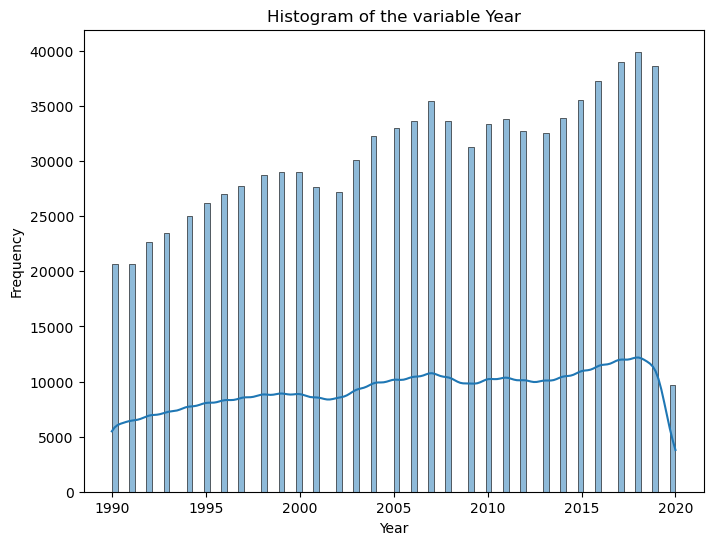

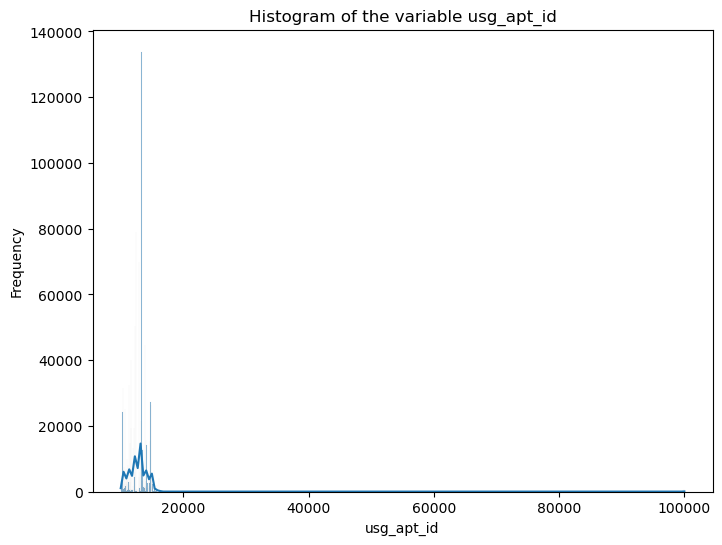

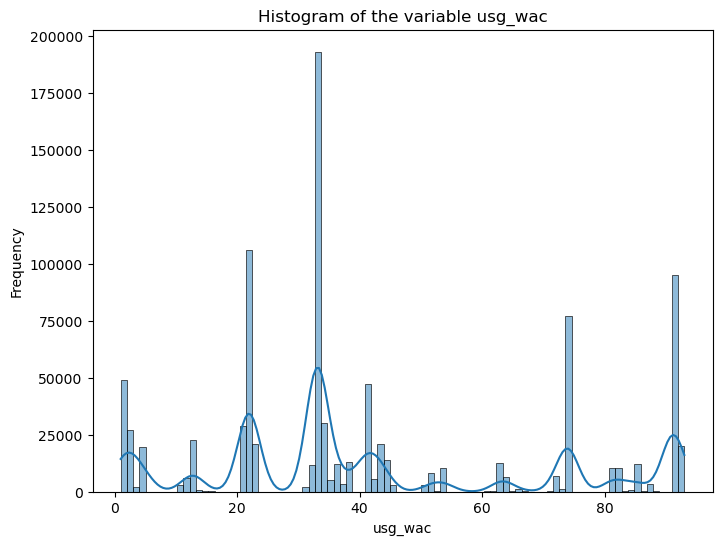

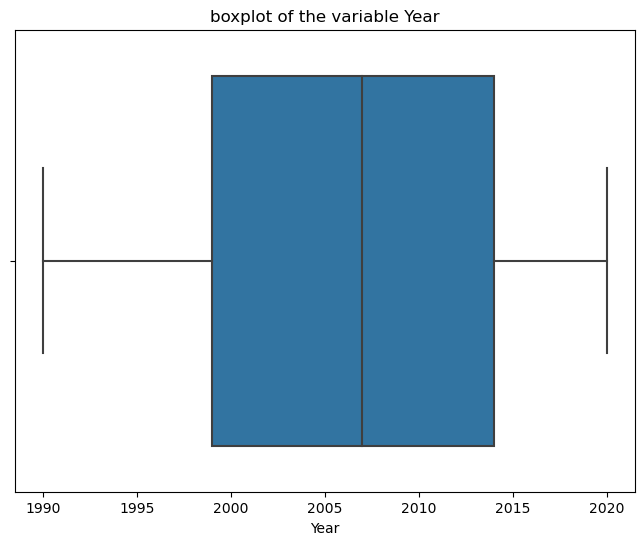

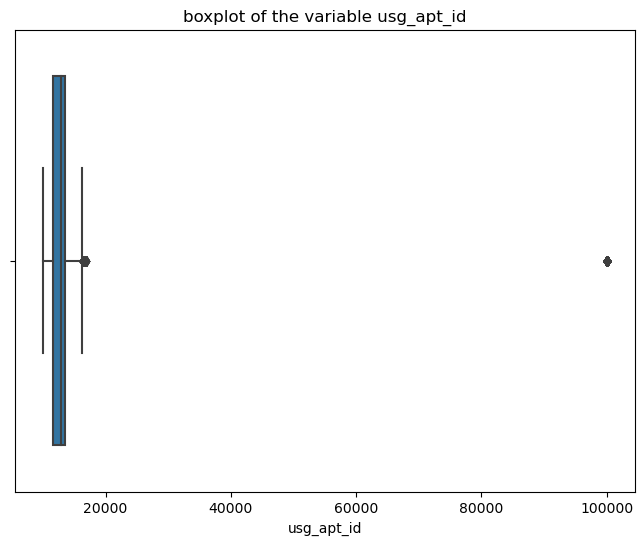

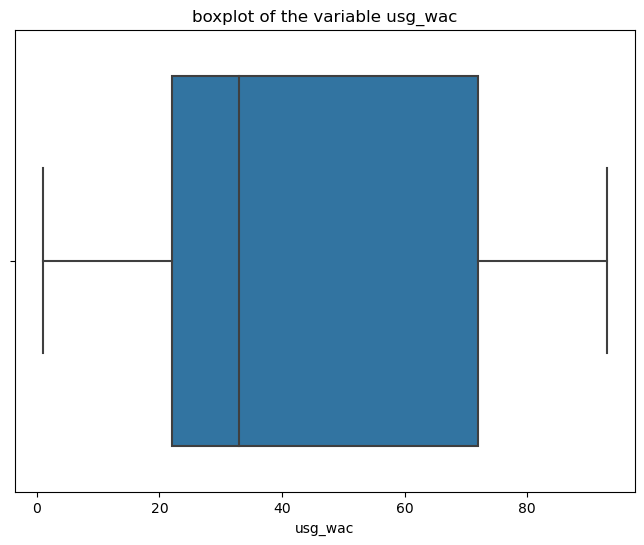

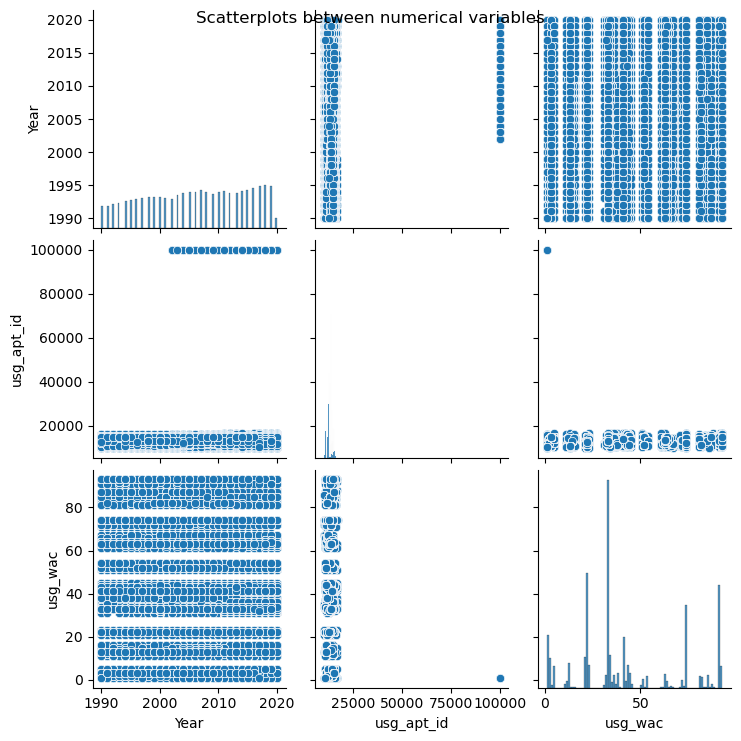

In [37]:
# تحليل البيانات العددية
analyze_numeric_data(selected_data)


In [38]:
# تحليل البيانات الفئوية
analyze_categorical_data(selected_data)


In [39]:
print('2.LabelCoding categorical data')

# العثور على الأعمدة من نوع 'object'
object_columns = dataset.select_dtypes(include=['object']).columns

if not object_columns.empty:
    print("Column names of type 'object' that can be encodedا:")
    for col in object_columns:
        print(col)
else:
    print("There are no columns of type 'object' in the data set.")


2.LabelCoding categorical data
Column names of type 'object' that can be encodedا:
data_dte
usg_apt
fg_apt
carrier
type


In [40]:
# العثور على الأعمدة من نوع 'object'
object_columns = dataset.select_dtypes(include=['object']).columns

if not object_columns.empty:
    print("Column names of type 'object' that can be encoded:")
    for col in object_columns:
        print(col)
    
    # استدعاء الدالة get_selected_features_from_user() فقط إذا كانت هناك أعمدة من نوع 'object'
    selected_features = get_selected_features_from_user()
    
    # التحقق من وجود متغيرات محددة
    if not selected_features:
        encoded_data = dataset
        print("No variables specified. No variables of categorical type have been specified to be encoded.")
        print('\n')
    else:
        # السماح للمستخدم بإدخال نوع الترميز
        while True:
            encoding_type = input("Enter encoding type ('label' or 'one-hot'): ")

            # التحقق من صحة نوع الترميز المدخل
            if encoding_type in ['label', 'one-hot']:
                break
            else:
                print("Invalid encoding type. Please enter 'label' or 'one-hot'.")

        # استخدام الدالة لترميز البيانات باستخدام نوع الترميز المحدد
        encoded_data = encode_selected_features(dataset, selected_features, encoding_type)
        print("Encoding process: The specified variables were successfully encoded.")
else:
    print("There are no columns of type 'object' in the data set.")
    encoded_data = dataset


Column names of type 'object' that can be encoded:
data_dte
usg_apt
fg_apt
carrier
type
Enter the variable name (Press Enter to finish): data_dte
Enter the variable name (Press Enter to finish): usg_apt
Enter the variable name (Press Enter to finish): fg_apt
Enter the variable name (Press Enter to finish): carrier
Enter the variable name (Press Enter to finish): type
Enter the variable name (Press Enter to finish): 
Enter encoding type ('label' or 'one-hot'): label
Encoding process: The specified variables were successfully encoded.


In [41]:
encoded_data 

,data_dte,Year,Month,usg_apt_id,usg_apt,usg_wac,fg_apt_id,fg_apt,fg_wac,airlineid,carrier,carriergroup,type,Scheduled,Charter,Total
0,139,2006,5,12016,366,5,13162,783,844,20177,509,1,0,0,10,10
1,136,2003,5,10299,36,1,13856,979,736,20007,89,1,0,0,15,15
2,79,2007,3,10721,113,13,12651,642,439,20402,302,1,0,0,1,1
3,347,2004,12,11259,203,74,16271,1639,936,20201,147,1,0,0,1,1
4,142,2009,5,13303,572,33,11075,276,219,21323,86,0,0,0,20,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
930803,193,2000,7,13303,572,33,13605,909,204,20398,449,1,0,1422,0,1422
930804,122,2019,4,13303,572,33,14286,1086,162,19770,211,0,0,1439,0,1439
930805,223,2000,8,13303,572,33,13605,909,204,20398,449,1,0,1441,0,1441
930806,257,2004,9,12266,418,74,15632,1425,148,19534,146,0,0,1461,0,1461


In [42]:
# 4. Examining and treating outliers in numerical data
# السماح للمستخدم بتحديد ما إذا كان يرغب في معالجة القيم المتطرفة
print('\n')
print('4. Examining and treating outliers in numerical data')
print('\n')
selected_features = encoded_data.columns  # اختيار جميع الأعمدة

while True:
    try:
        process_outliers = input("Do you want to handle outliers? (yes/no): ").strip().lower()
        if process_outliers not in ['yes', 'no']:
            raise ValueError("Invalid input. Please enter 'yes' or 'no'.")
        break  # إذا كان الإدخال صحيحًا، انهي الحلقة
    except ValueError as e:
        print(f"Error: {e}")
        print("Please try again.")


if process_outliers == 'yes':
    # طلب من المستخدم اختيار نوع التحويل
    while True:
        try:
            outlier_strategy = input("Choose a strategy for handling outliers (clip/replace/std): ")
            if outlier_strategy not in ['clip', 'replace', 'std']:
                raise ValueError("Invalid outlier strategy. Please choose from 'clip', 'replace', or 'std'.")
            break  # إذا كان الإدخال صحيحًا، انهي الحلقة
        except ValueError as e:
            print(f"Error: {e}")
            print("Please try again.")

    # تنفيذ المعالجة باستخدام الاستراتيجية المحددة
    data_numeric_no_outliers = handle_outliers_iqr(encoded_data[selected_features], outlier_strategy=outlier_strategy)
    print("Processing process, Outlier data was processed successfully.")
else:
    data_numeric_no_outliers = encoded_data[selected_features]
    print("No outlier processing performed.")




4. Examining and treating outliers in numerical data


Do you want to handle outliers? (yes/no): 
Error: Invalid input. Please enter 'yes' or 'no'.
Please try again.
Do you want to handle outliers? (yes/no): yes
Choose a strategy for handling outliers (clip/replace/std): 
Error: Invalid outlier strategy. Please choose from 'clip', 'replace', or 'std'.
Please try again.
Choose a strategy for handling outliers (clip/replace/std): std
Processing process, Outlier data was processed successfully.


In [43]:
data_numeric_no_outliers

,data_dte,Year,Month,usg_apt_id,usg_apt,usg_wac,fg_apt_id,fg_apt,fg_wac,airlineid,carrier,carriergroup,type,Scheduled,Charter,Total
0,139,2006,5,12016.0,366,5,13162,783,844,20177.000000,509,1,0,0.000000,17.556806,10.00000
1,136,2003,5,10299.0,36,1,13856,979,736,20007.000000,89,1,0,0.000000,17.556806,15.00000
2,79,2007,3,10721.0,113,13,12651,642,439,20402.000000,302,1,0,0.000000,1.000000,1.00000
3,347,2004,12,11259.0,203,74,16271,1639,936,20201.000000,147,1,0,0.000000,1.000000,1.00000
4,142,2009,5,13303.0,572,33,11075,276,219,21270.142912,86,0,0,0.000000,17.556806,20.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
930803,193,2000,7,13303.0,572,33,13605,909,204,20398.000000,449,1,0,181.897946,0.000000,180.68167
930804,122,2019,4,13303.0,572,33,14286,1086,162,19770.000000,211,0,0,181.897946,0.000000,180.68167
930805,223,2000,8,13303.0,572,33,13605,909,204,20398.000000,449,1,0,181.897946,0.000000,180.68167
930806,257,2004,9,12266.0,418,74,15632,1425,148,19534.000000,146,0,0,181.897946,0.000000,180.68167


In [44]:
# 5. perform_transformation data data

print('\n')
print('5. perform_transformation data')
print('\n')
# السماح للمستخدم بتحديد ما إذا كان يرغب في تنفيذ التحويل (transformation) على البيانات
while True:
    try:
        perform_transformation = input("Do you want to perform data transformation? (yes/no): ").strip().lower()
        if perform_transformation not in ['yes', 'no']:
            raise ValueError("Invalid input. Please enter 'yes' or 'no'.")
        break  # إذا كان الإدخال صحيحًا، انهي الحلقة
    except ValueError as e:
        print(f"Error: {e}")
        print("Please try again.")

if perform_transformation == 'yes':
    transf_data = data_numeric_no_outliers.copy()
    
    # طلب من المستخدم اختيار نوع التحويل
    while True:
        try:
            transformation_type = input("Choose the transformation type data (std/min_max/normalize): ").strip().lower()
            if transformation_type not in ["std", "min_max", "normalize"]:
                raise ValueError("Invalid transformation type. Please choose from 'std', 'min_max', or 'normalize'.")
            break  # إذا كان الإدخال صحيحًا، انهي الحلقة
        except ValueError as e:
            print(f"Error: {e}")
            print("Please try again.")
    
    # تطبيق التحويل المحدد بواسطة المستخدم
    transformed_data = apply_transformation(transf_data, transformation_type)
    print("\n", "Processing process, apply transformation data was processed successfully.")
    
else:
    transformed_data = data_numeric_no_outliers
    print("No data transformation performed.")




5. perform_transformation data


Do you want to perform data transformation? (yes/no): 
Error: Invalid input. Please enter 'yes' or 'no'.
Please try again.
Do you want to perform data transformation? (yes/no): yes
Choose the transformation type data (std/min_max/normalize): normalize

 Processing process, apply transformation data was processed successfully.


In [45]:
# عرض البيانات المحولة
print("transformation data:")
transformed_data


transformation data:


,data_dte,Year,Month,usg_apt_id,usg_apt,usg_wac,fg_apt_id,fg_apt,fg_wac,airlineid,carrier,carriergroup,type,Scheduled,Charter,Total
0,-0.399387,-0.002496,-0.407593,-0.539756,-0.478671,-1.360534,-0.166965,-0.201834,1.309311,0.296761,0.696099,0.817584,NaN,-0.775351,2.582660,-0.620219
1,-0.427954,-0.353011,-0.407593,-1.801082,-1.832272,-1.505612,0.192137,0.194504,0.934319,-0.086569,-1.355440,0.817584,NaN,-0.775351,2.582660,-0.514192
2,-0.970730,0.114343,-0.983784,-1.491076,-1.516432,-1.070377,-0.431375,-0.486955,-0.096909,0.804108,-0.315017,0.817584,NaN,-0.775351,-0.254367,-0.811069
3,1.581268,-0.236173,1.609076,-1.095856,-1.147268,1.142065,1.441748,1.529114,1.628749,0.350878,-1.072133,0.817584,NaN,-0.775351,-0.254367,-0.811069
4,-0.370820,0.348019,-0.407593,0.405688,0.366305,-0.344987,-1.246856,-1.227057,-0.860782,2.761665,-1.370094,-1.223115,NaN,-0.775351,2.582660,-0.408164
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
930803,0.114821,-0.703526,0.168599,0.405688,0.366305,-0.344987,0.062260,0.052955,-0.912865,0.795089,0.403022,0.817584,NaN,3.007457,-0.425719,2.999178
930804,-0.561268,1.516403,-0.695688,0.405688,0.366305,-0.344987,0.414635,0.410873,-1.058695,-0.620975,-0.759517,-1.223115,NaN,3.007457,-0.425719,2.999178
930805,0.400493,-0.703526,0.456694,0.405688,0.366305,-0.344987,0.062260,0.052955,-0.912865,0.795089,0.403022,0.817584,NaN,3.007457,-0.425719,2.999178
930806,0.724254,-0.236173,0.744790,-0.356103,-0.265376,1.142065,1.111106,1.096377,-1.107305,-1.153126,-1.077017,-1.223115,NaN,3.007457,-0.425719,2.999178




6. visualization after preprocessing




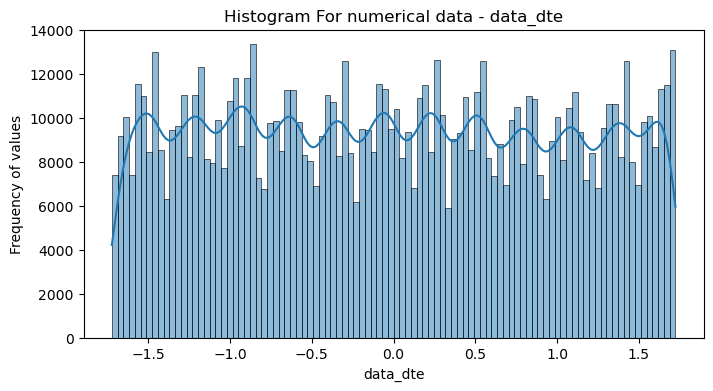

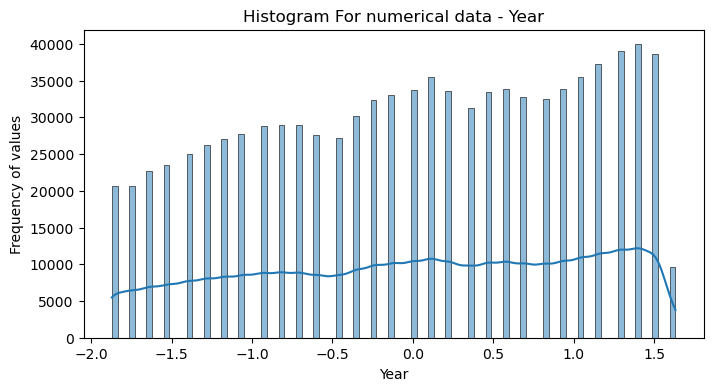

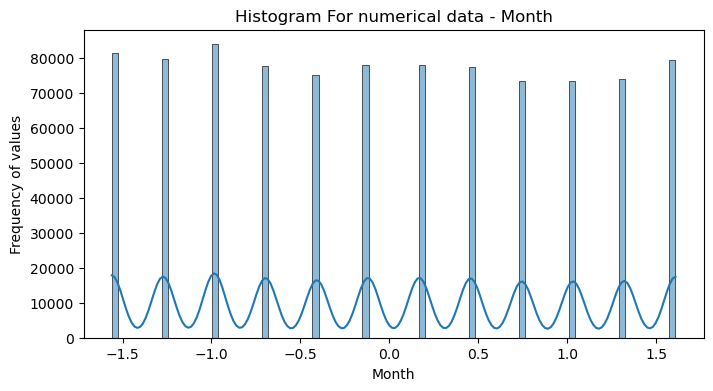

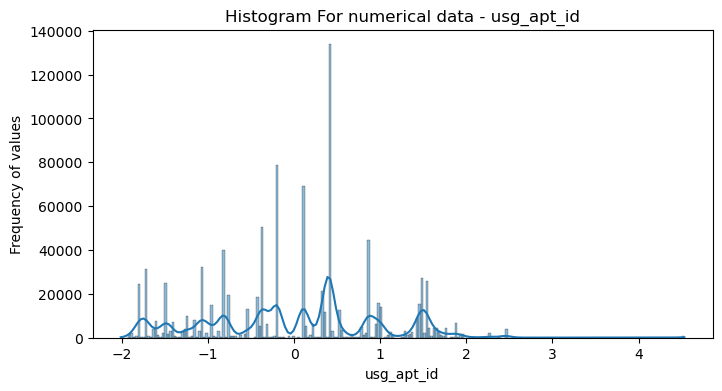

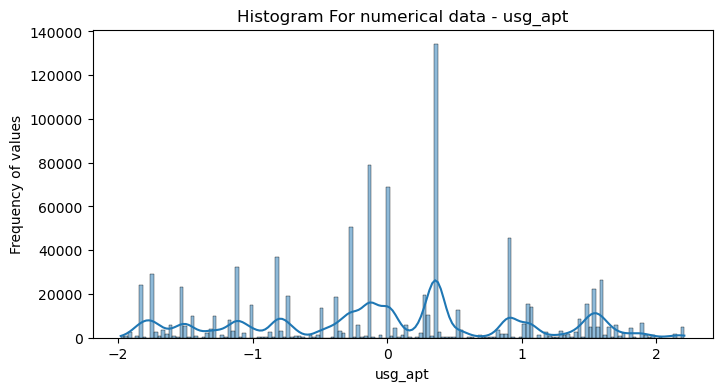

...

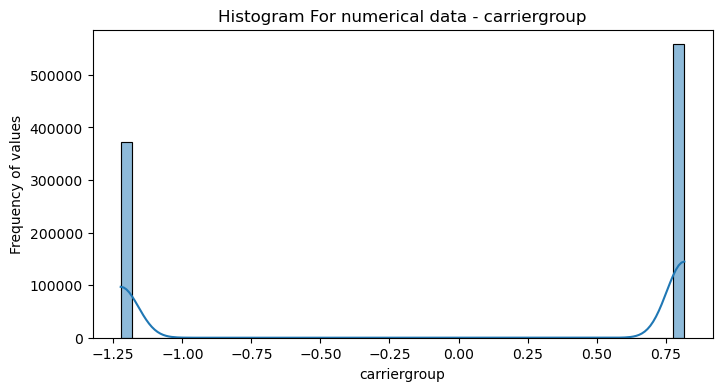

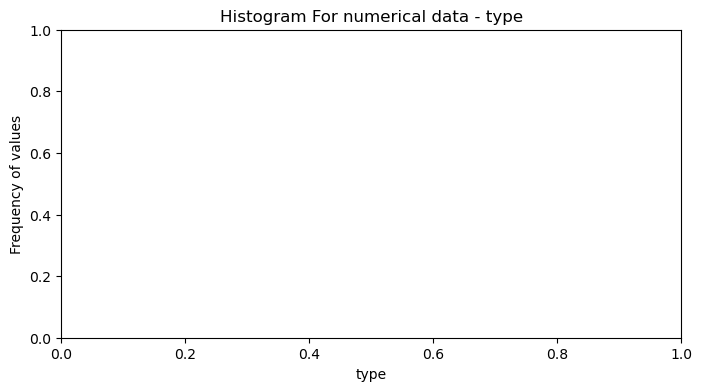

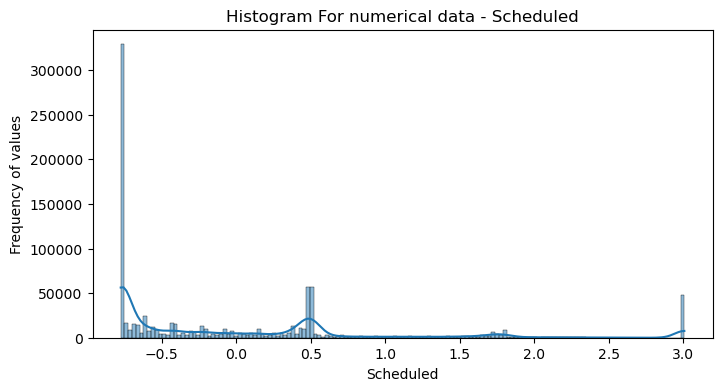

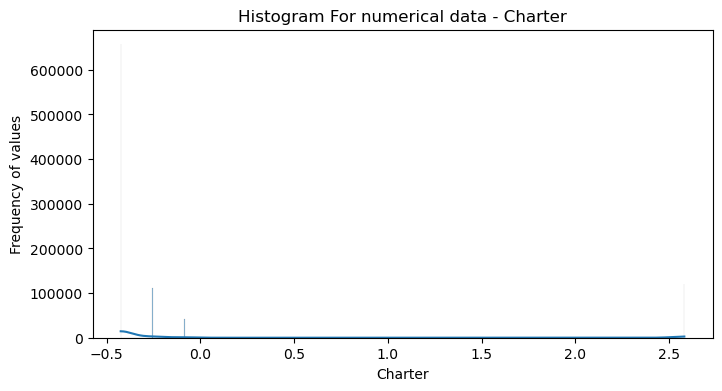

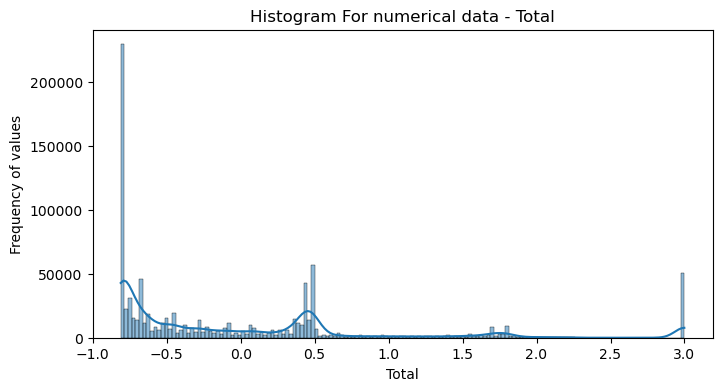

In [46]:
#6: visualization after preprocessing
##Calling functions to draw visualizations
print('\n')
print('6. visualization after preprocessing')
print('\n')
# استدعاء الدوال لرسم التصورات
plot_histograms(transformed_data)  # رسم histograms


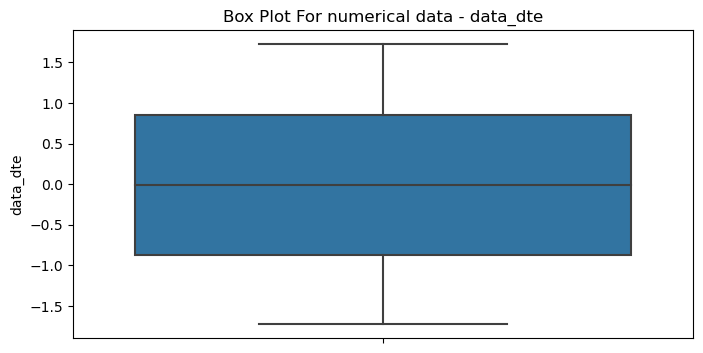

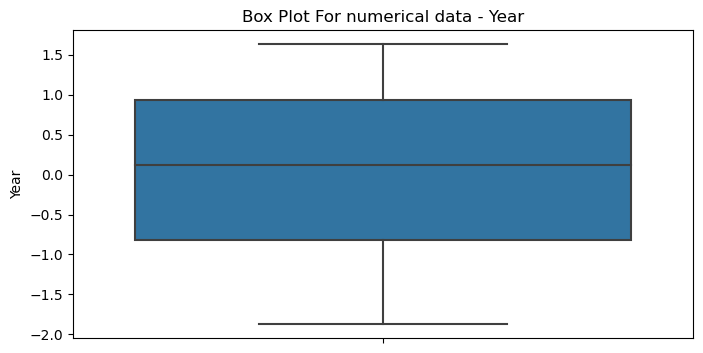

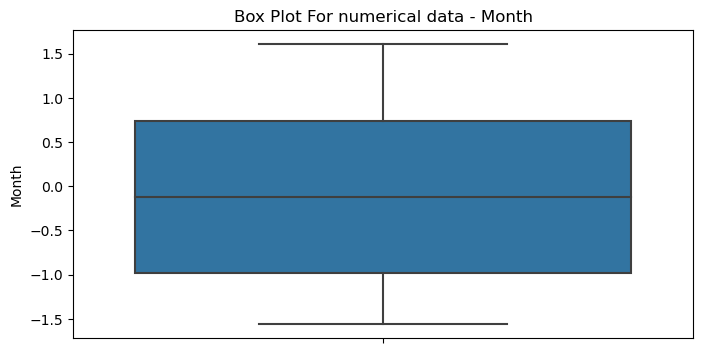

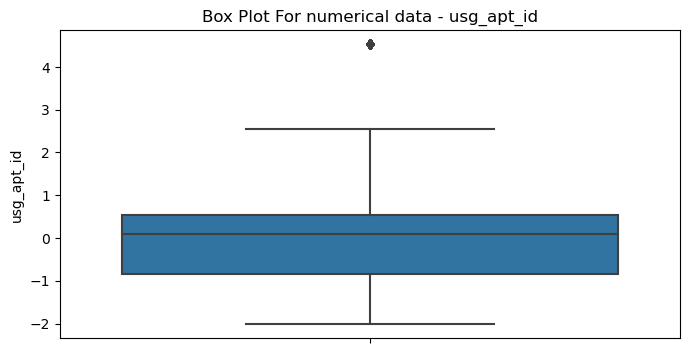

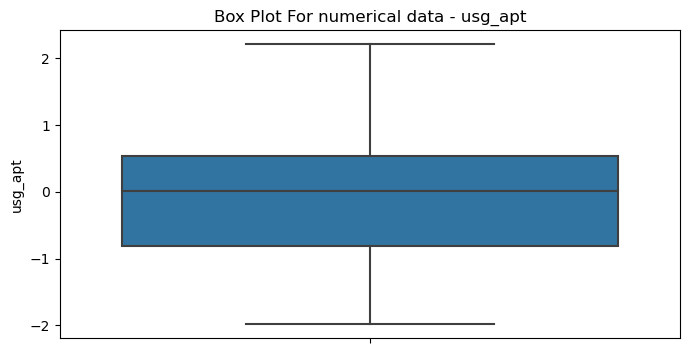

...

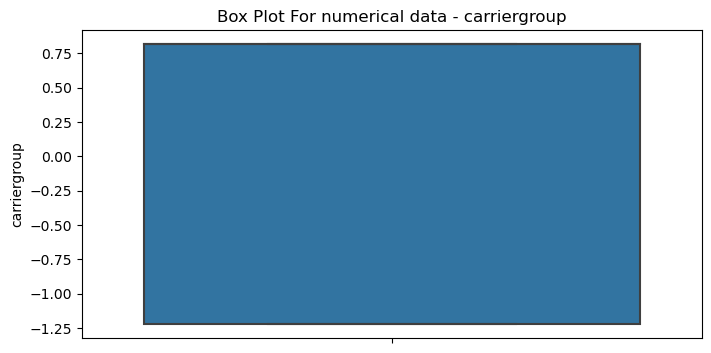

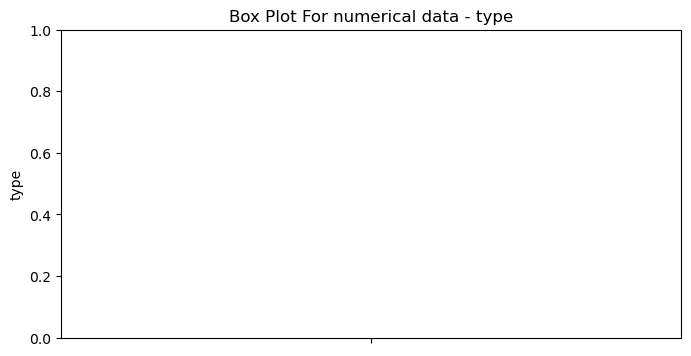

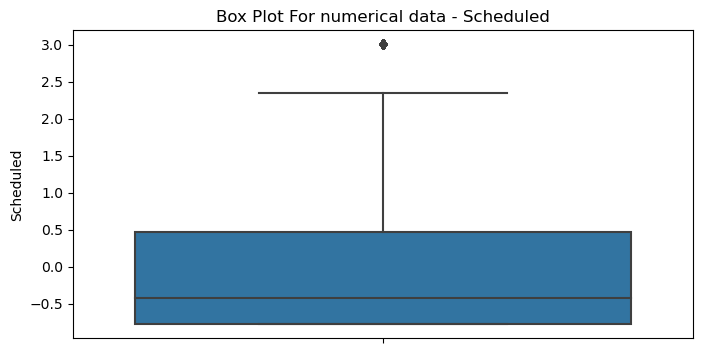

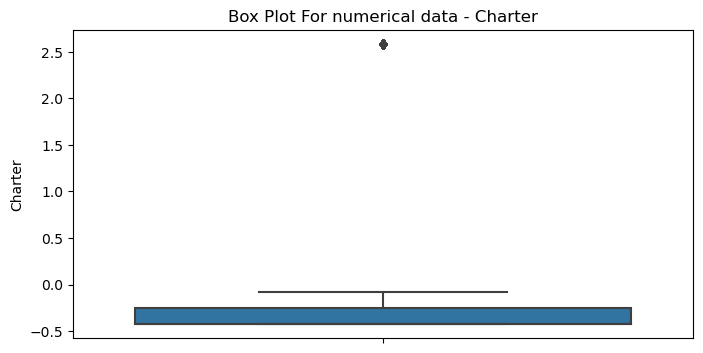

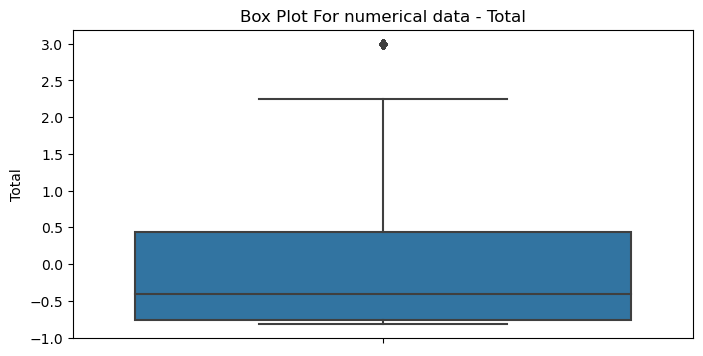

In [47]:
plot_box_plots(transformed_data)  # رسم box plots


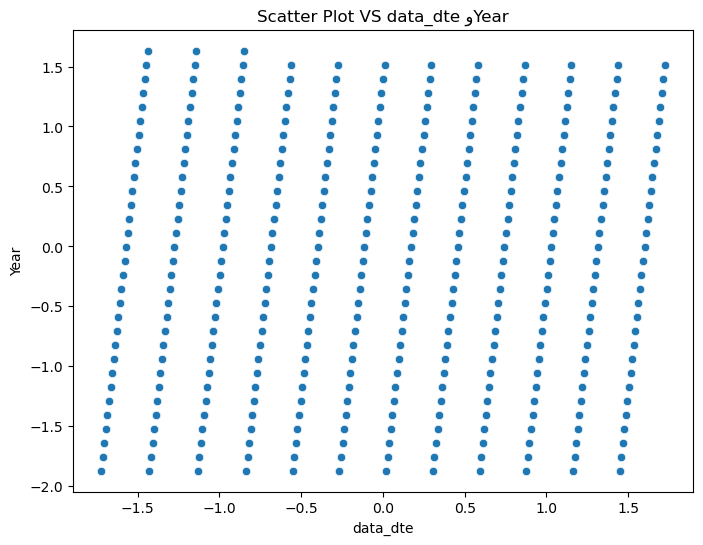

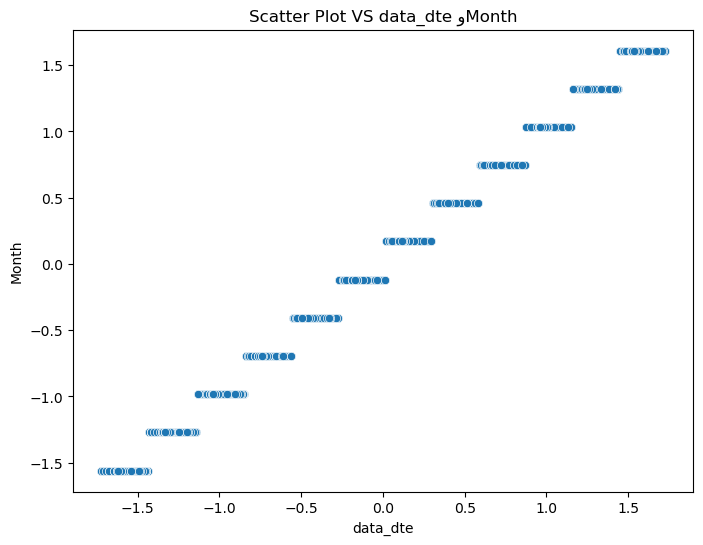

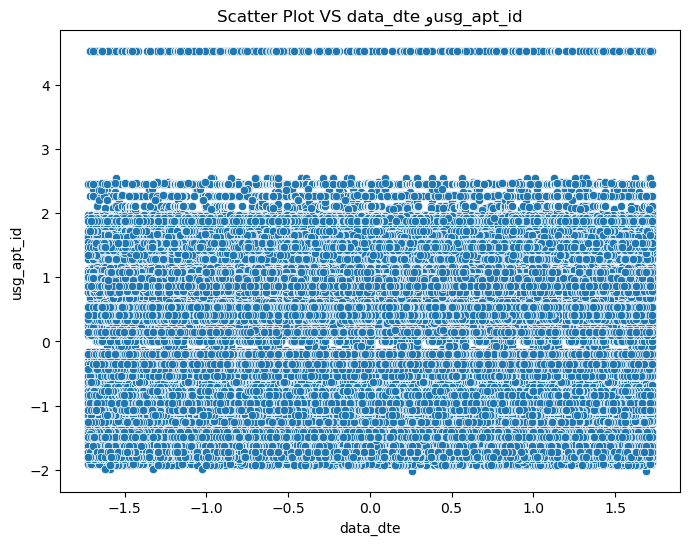

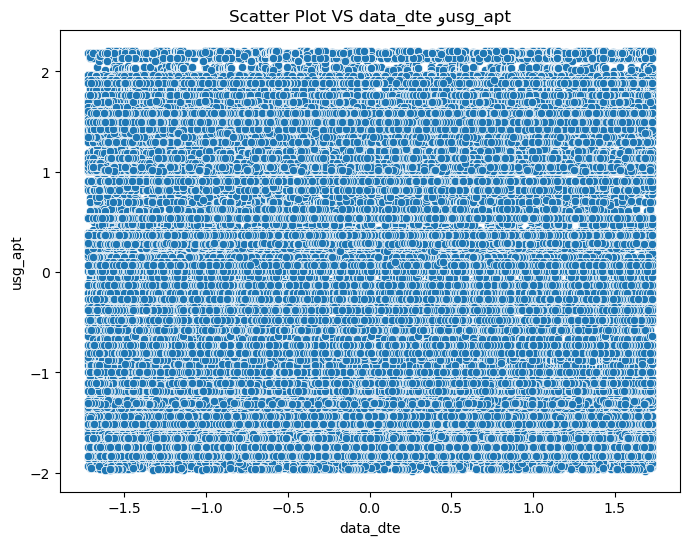

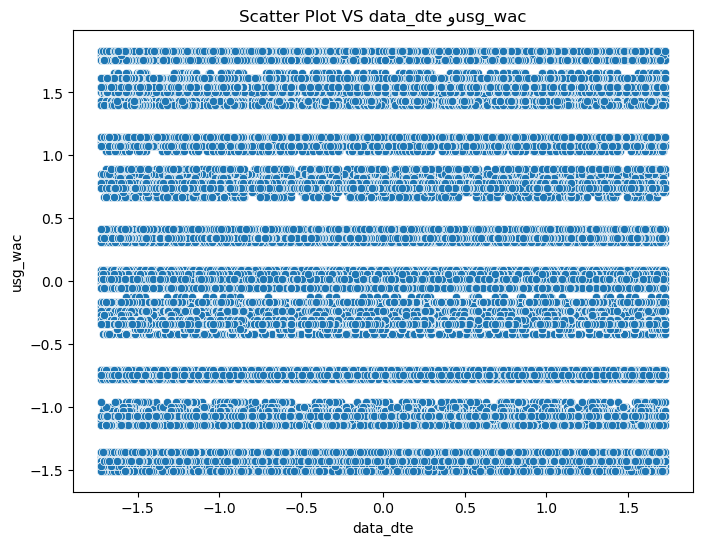

...

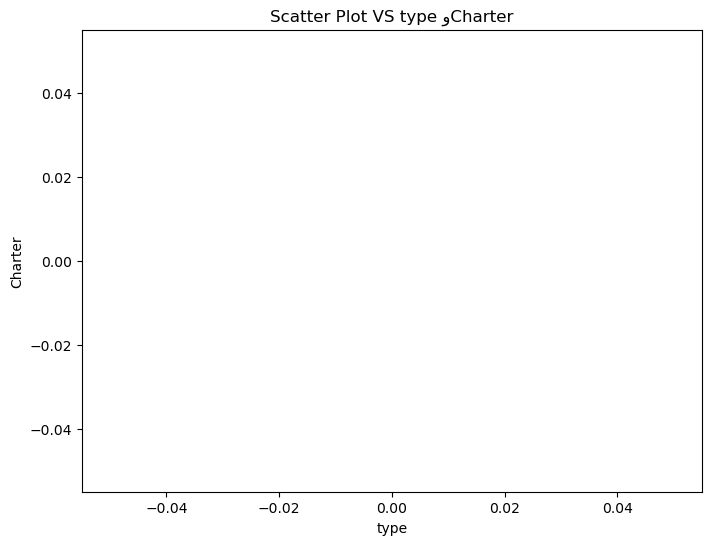

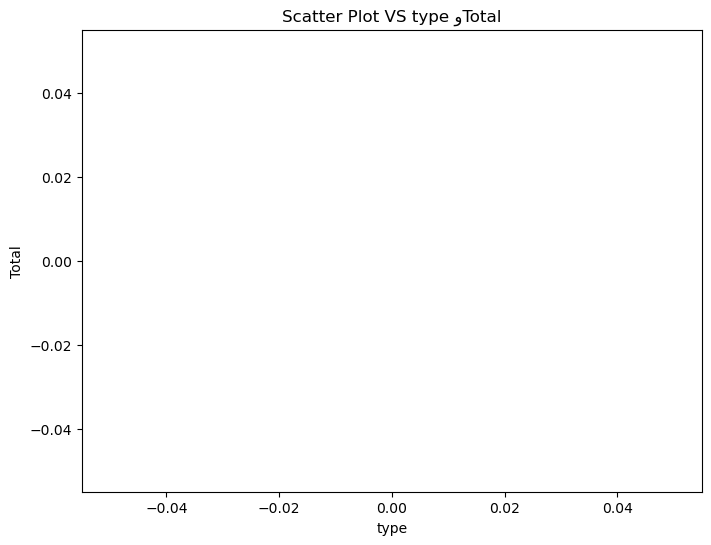

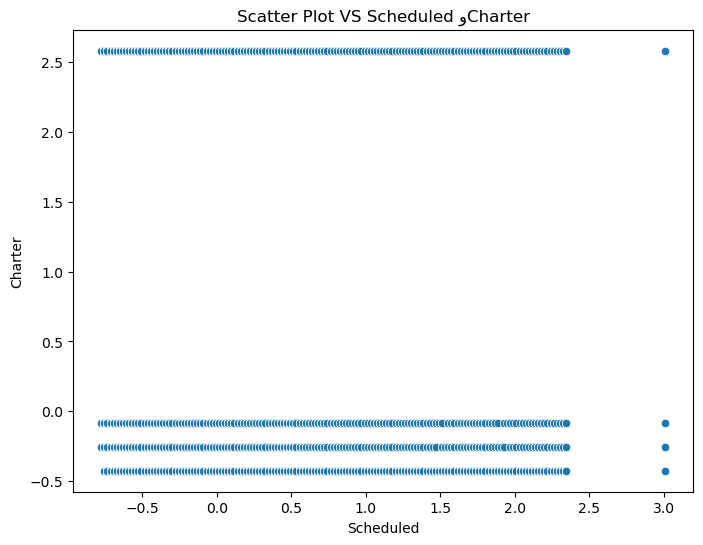

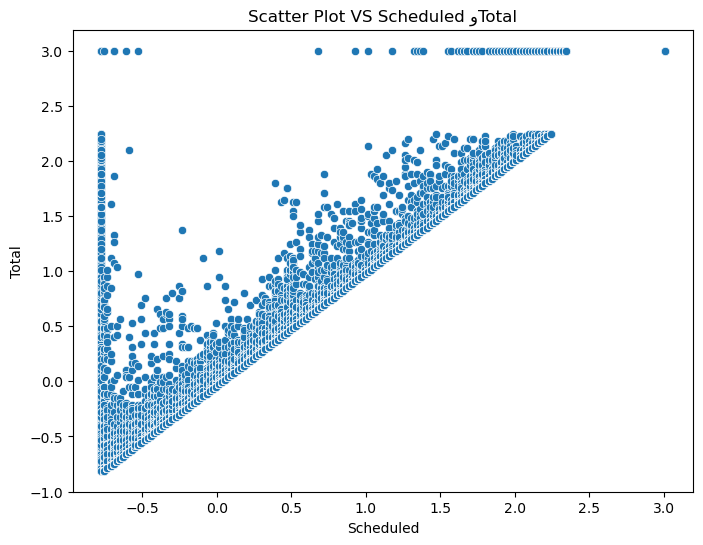

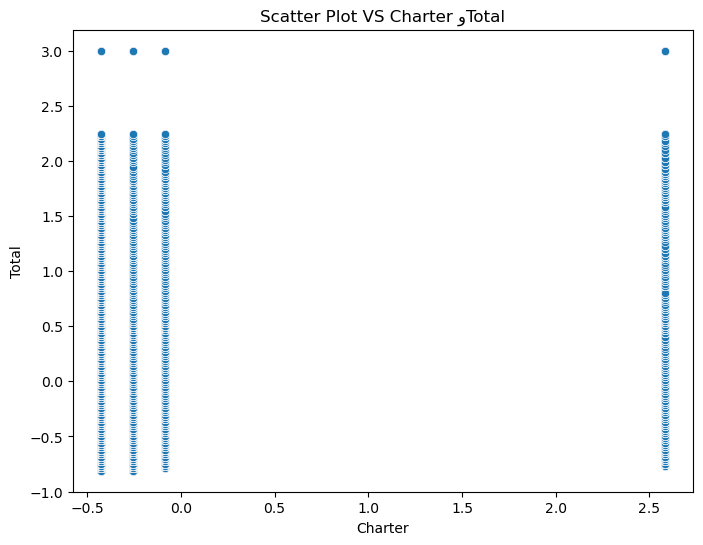

In [48]:
plot_scatter_plots(transformed_data)  # رسم scatter plots


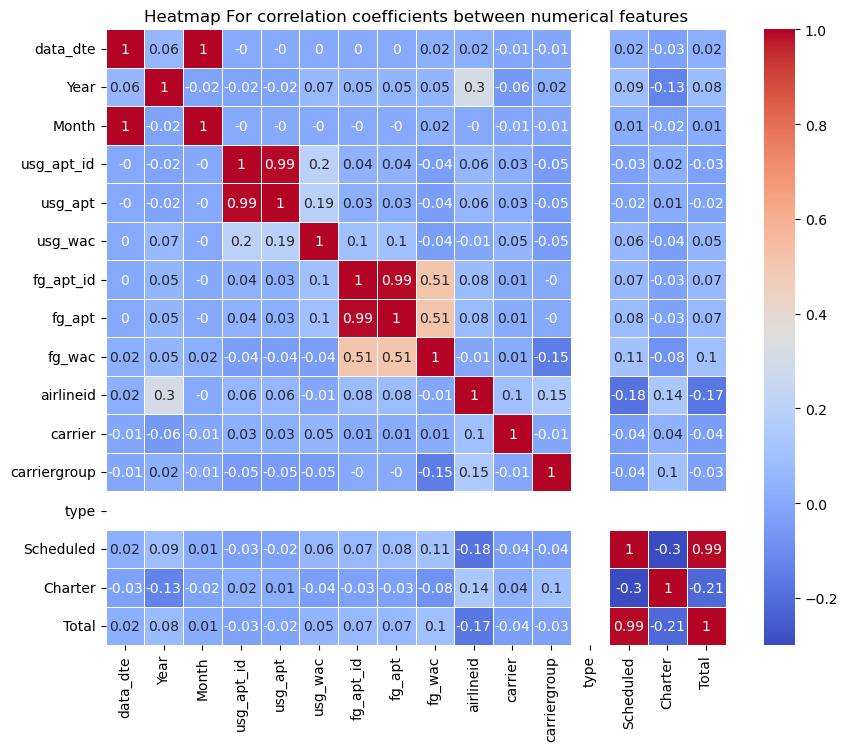

In [49]:
plot_correlation_heatmap(transformed_data)   # رسم Heatmap لمعاملات الارتبا

In [50]:
#7: Reducing dimensions and preparing them
print('\n')
print('7. Reducing dimensions and preparing them')
print('\n')
n_components = 2  # عدد المكونات الرئيسية المطلوبة
reduced_data = dimensionality_reduction(transformed_data, n_components)
    
print("Data after dimension reduction:")
print(reduced_data.head())



7. Reducing dimensions and preparing them


Data after dimension reduction:
   Component 1  Component 2
0    -0.888456     0.629928
1    -0.736737    -0.747134
2    -1.405739    -0.821946
3     1.804214     0.194188
4    -2.471419     1.217811


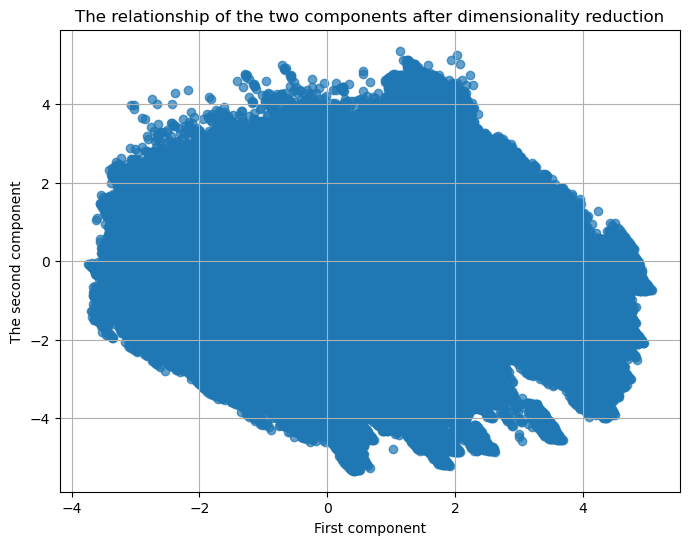

In [51]:
# رسم العلاقة بين المكونين
plot_2d_components(reduced_data)
